In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
from tqdm import tqdm
import warnings
import pandas as pd
from scipy.spatial.distance import cdist
import skimage as ski
from skimage.transform import resize
import warnings
import cmcrameri.cm as cmc
import matplotlib.ticker as ticker
import sys

warnings.filterwarnings('ignore')

working_dir = os.getcwd()
#get one level up
demo_dir = os.path.dirname(working_dir)

# Import PRINGLE modules
sys.path.append(os.path.join(demo_dir,'PRGL_modules'))  
from PRINGLE import *

In [8]:
#Load example data
all_cells = pd.read_csv(os.path.join(working_dir,'fly_example_data.csv'))

no_embryos = len(all_cells['embryo'].unique())

#Define which channel is the midline channel
midline_channel = 'twist'

#veiw data
print(all_cells.head())

# This is pre-oriented through the pre-processing pipeline, but if you want to re-orient the data, you can do so here.
all_cells['Oriented_X'] = all_cells['X']
all_cells['Oriented_Y'] = all_cells['Y']

        zen       sim       ind     twist      salm  embryo           X  \
0  1.032247  0.813829  0.104667  0.011159  0.008175       2   73.089906   
1  0.210296  0.722039  0.113162  0.012329  0.006860       2   88.017581   
2  0.340298  0.741472  0.116502  0.010648  0.007423       2   93.736055   
3  0.243547  0.718788  0.109743  0.008142  0.006783       2   99.581092   
4  0.684360  0.666276  0.100300  0.005646  0.156904       2  110.494287   

           Y          Z  
0  66.067182 -18.027695  
1  63.883517 -17.562428  
2  64.742808 -17.650035  
3  66.503443 -17.888447  
4  65.792214 -17.274057  


## 1. Flatten Embryo

#### Orient embryo to major axis of embryo

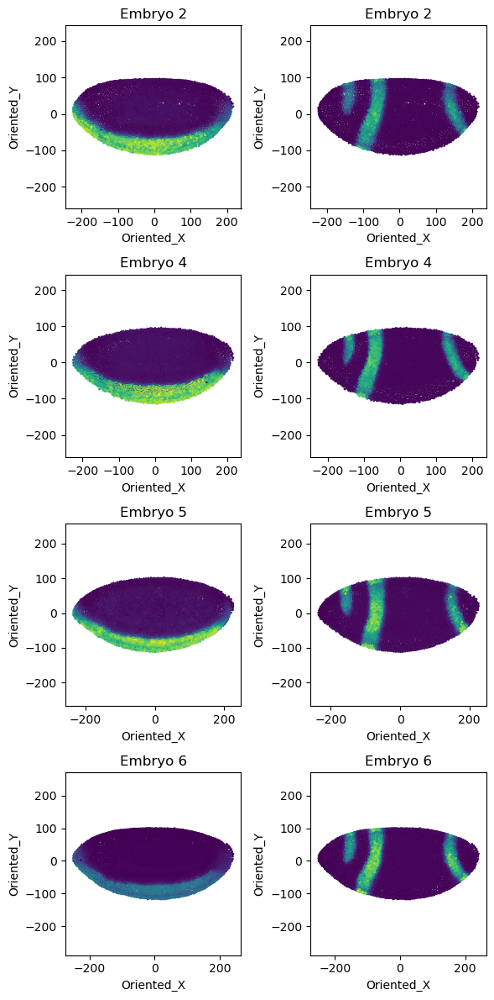

In [9]:
# embryos were pre-aligned in the anterior-posterior direction
# below is the outline of this process
fig, ax = plt.subplots(len(all_cells['embryo'].unique()), 2, 
                       figsize=(6, 3*len(all_cells['embryo'].unique())))

for idx, embryo in enumerate(all_cells['embryo'].unique()):
    temp = all_cells[all_cells['embryo']==embryo]


    # Flip so that the lower side of the midline channel is brighter
    if temp.loc[temp['Oriented_Y'] > 0, 'twist'].mean() > temp.loc[temp['Oriented_Y'] < 0, 'twist'].mean():
        temp['Oriented_Y'] = -temp['Oriented_Y']
        temp['Y'] = -temp['Y']

    # Flip so that the left side of the AP channel is brighter
    if temp.loc[temp['Oriented_X'] > 0, 'salm'].mean() > temp.loc[temp['Oriented_X'] < 0, 'salm'].mean():
        temp['Oriented_X'] = -temp['Oriented_X']
        temp['Y'] = -temp['Y']

    # plot the data
    ax[idx, 0].scatter(temp['Oriented_X'], temp['Oriented_Y'], c=temp[midline_channel], s=1, cmap='viridis')
    ax[idx, 0].set_title(f'Embryo {embryo}')
    ax[idx, 0].set_xlabel('Oriented_X')
    ax[idx, 0].set_ylabel('Oriented_Y')
    ax[idx, 0].axis('equal')

    ax[idx, 1].scatter(temp['X'], temp['Y'], c=temp['salm'], s=1, cmap='viridis')
    ax[idx, 1].set_title(f'Embryo {embryo}')
    ax[idx, 1].set_xlabel('Oriented_X')
    ax[idx, 1].set_ylabel('Oriented_Y')
    ax[idx, 1].axis('equal')

plt.tight_layout()


### Smooth midline channel twist

Iteration round: 0
Iteration round: 1
Iteration round: 2
Iteration round: 3
Iteration round: 4
Iteration round: 0
Iteration round: 1
Iteration round: 2
Iteration round: 3
Iteration round: 4
Iteration round: 0
Iteration round: 1
Iteration round: 2
Iteration round: 3
Iteration round: 4
Iteration round: 0
Iteration round: 1
Iteration round: 2
Iteration round: 3
Iteration round: 4


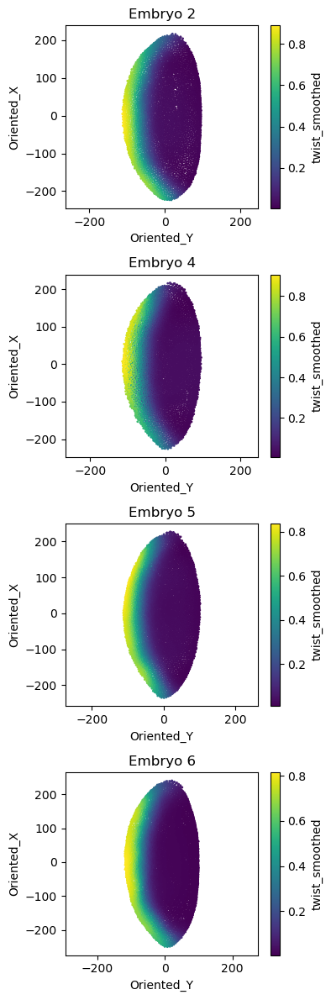

In [10]:
#loop through each embryo to smooth the midline channel

for idx, embryo in enumerate(all_cells['embryo'].unique()):
    epi_nuc = all_cells[(all_cells['embryo'] == embryo)]

    #Store original index
    index = epi_nuc.index

    #reset index
    epi_nuc = epi_nuc.reset_index(drop=True)

    # Smooth signal in XYZ coordinates
    smoothed_props, smoothed_signal = smooth_signal_in_point_cloud(points = epi_nuc[['Z', 'X', 'Y']].values, 
                                                                     signal = epi_nuc[midline_channel], 
                                                                     iterations=5, # Number of iterations for smoothing
                                                                     radius=20) # Radius of smoothing in microns

    # Store smoothed signal in main dataframe
    all_cells.loc[index, midline_channel + '_smoothed'] = smoothed_signal

#Set new column name
smth_midline_channel = midline_channel + '_smoothed'

#Plot output
fig, ax = plt.subplots(no_embryos, 1, figsize=(4, no_embryos*3))

for idx, embryo in enumerate(all_cells['embryo'].unique()):
    epi_nuc = all_cells[all_cells['embryo'] == embryo]

    # Scatter plot with color mapping
    scatter = ax[idx].scatter(epi_nuc['Oriented_Y'], epi_nuc['Oriented_X'], 
                              c=epi_nuc[smth_midline_channel], s=1, cmap='viridis')

    ax[idx].set_title(f'Embryo {embryo}')
    ax[idx].axis('equal')
    ax[idx].set_xlabel('Oriented_Y')
    ax[idx].set_ylabel('Oriented_X')

    # Add individual colorbar to each subplot
    cbar = plt.colorbar(scatter, ax=ax[idx])
    cbar.set_label(smth_midline_channel)

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()


#### Orient so midline channel to centre and left-right

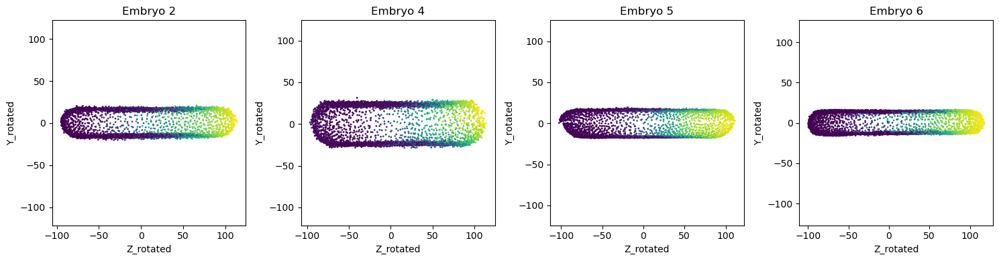

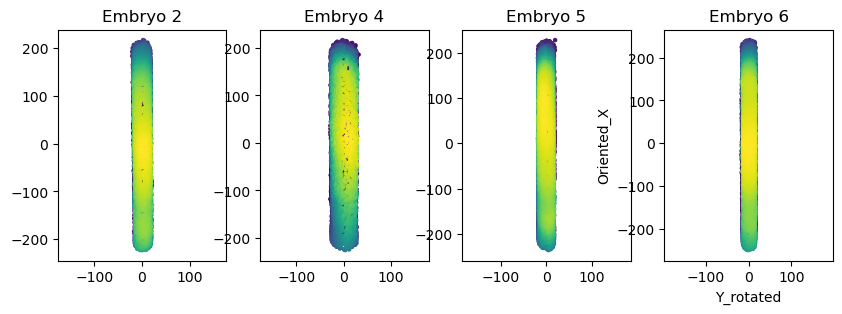

In [ ]:
def rotate_z_y_plane(points, angle):
    """
    Rotates a set of (Z, Y) points around the centroid by the given angle.

    Args:
        points (np.ndarray): Shape (N, 2), containing (Z, Y) coordinates.
        angle (float): Rotation angle in degrees.

    Returns:
        np.ndarray: Rotated points (N, 2).
    """
    angle_rad = np.radians(angle)  # Convert degrees to radians

    # 2D Rotation matrix for Z-Y plane
    rotation_matrix = np.array([
        [np.cos(angle_rad), -np.sin(angle_rad)],
        [np.sin(angle_rad), np.cos(angle_rad)]
    ])

    # Apply rotation
    return np.dot(points, rotation_matrix.T)  # Transpose ensures correct multiplication


# Create subplots for visualization
fig, ax = plt.subplots(1, 4, figsize=(15, 4))

# Process each embryo separately
for i, embryo in enumerate(all_cells['embryo'].unique()):
    temp = all_cells[all_cells['embryo'] == embryo].copy()  # Ensure we don't modify the original

    # Compute centroid (mean position)
    centroid = temp[['Z', 'Y']].mean(axis=0).values

    # Subtract centroid, rotate, then add centroid back
    rotated_points = rotate_z_y_plane(temp[['Z', 'Oriented_Y']].values - centroid, 90) # Rotate by 90 degrees, or 270 if you want to rotate the other way
    temp['Z_rotated'] = rotated_points[:, 0] + centroid[0]
    temp['Y_rotated'] = rotated_points[:, 1] + centroid[1]

    # Store the results in all_cells
    all_cells.loc[temp.index, ['Z_rotated', 'Y_rotated']] = temp[['Z_rotated', 'Y_rotated']]

    # Scatter plot
    scatter = ax[i].scatter(temp['Z_rotated'], temp['Y_rotated'], 
                             c=temp[smth_midline_channel], s=1, cmap='viridis')
    
    ax[i].set_title(f'Embryo {embryo}')
    ax[i].set_xlabel('Z_rotated')
    ax[i].set_ylabel('Y_rotated')
    ax[i].axis('equal')

# plt.colorbar(scatter, ax=ax, orientation='vertical', label='Twist_smoothed')
plt.tight_layout()
plt.show()


fig, ax = plt.subplots(1, 4, figsize=(10, 3))
for i, embryo in enumerate(all_cells['embryo'].unique()):
    epi_nuc = all_cells[(all_cells['embryo'] == embryo)]
    #order by Z_rotated
    epi_nuc = epi_nuc.sort_values('Z_rotated')
    
    ax[i].scatter(epi_nuc['Y_rotated'], epi_nuc['Oriented_X'], c=epi_nuc[smth_midline_channel], s=5, cmap='viridis')
    ax[i].set_title(f'Embryo {embryo}')
    ax[i].axis('equal')
    plt.xlabel('Y_rotated')
    plt.ylabel('Oriented_X')

### Find midline i.e. smoothed channel

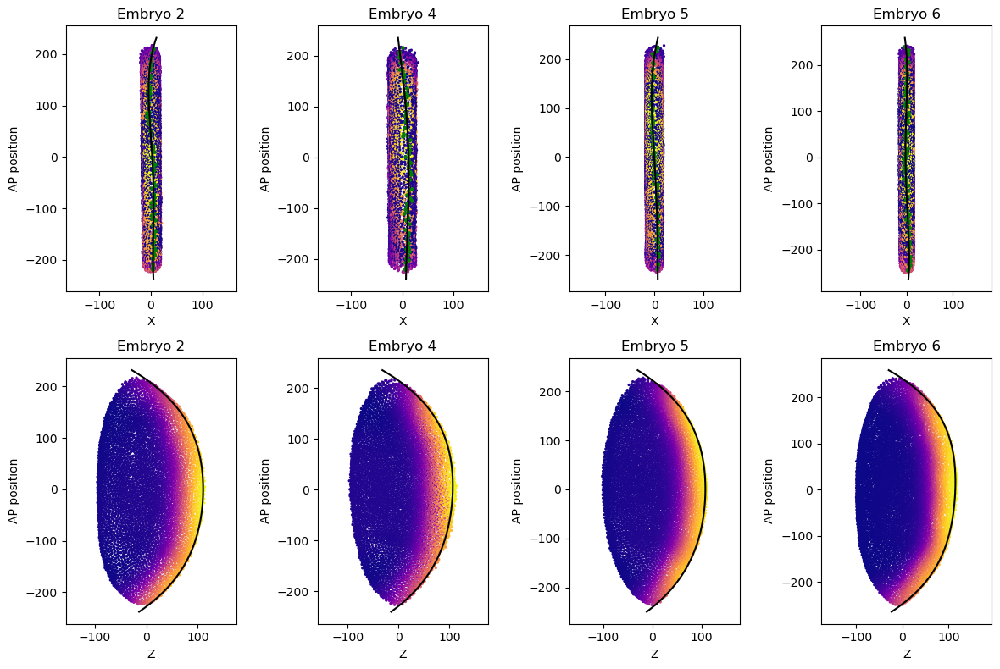

In [15]:
# #Set columns
x_col='Y_rotated'
y_col='Oriented_X'
z_col='Z_rotated'

smoothed_line_all = []
original_midpoints = []

for embryo in all_cells['embryo'].unique():
    # Isolate epiblast cells per embryo
    epi_nuc = all_cells[(all_cells['embryo'] == embryo) ]

    smoothed_line, centroids = find_midline(epi_nuc, 
                                      smth_midline_channel,
                                       x_col=x_col, 
                                       y_col=y_col, 
                                       z_col=z_col,
                                       percentile_threshold=0.8,
                                       lim_dist=10,
                                       window_size=10)
    smoothed_line['embryo'] = embryo
    smoothed_line_all.append(smoothed_line)

    centroids = pd.DataFrame(centroids, columns=[z_col, y_col, x_col])
    centroids['embryo'] = embryo
    original_midpoints.append(centroids)



#Plot original midline points and smoothed line in XY and XZ

fig, ax = plt.subplots(2, len(all_cells['embryo'].unique()), figsize=(12, 8))

for idx, embryo in enumerate(all_cells['embryo'].unique()):
    epi_nuc = all_cells[(all_cells['embryo'] == embryo) ]
    smoothed_line = smoothed_line_all[idx]
    centroids = original_midpoints[idx]

    ax[0, idx].scatter(epi_nuc[x_col], epi_nuc[y_col], c=epi_nuc[smth_midline_channel], s=2, cmap='plasma')  
    ax[0, idx].scatter(centroids[x_col], centroids[y_col], c='g', s=5)
    ax[0, idx].plot(smoothed_line[x_col], smoothed_line[y_col], c='black')
    ax[0, idx].axis('equal')
    ax[0, idx].set_title(f'Embryo {embryo}')
    ax[0, idx].set_xlabel('X')
    ax[0, idx].set_ylabel('AP position')

    ax[1, idx].scatter(epi_nuc[z_col], epi_nuc[y_col], c=epi_nuc[smth_midline_channel], s=2, cmap='plasma')
    ax[1, idx].plot(smoothed_line[z_col], smoothed_line[y_col], c='black')
    ax[1, idx].axis('equal')
    ax[1, idx].set_title(f'Embryo {embryo}')
    ax[1, idx].set_xlabel('Z')
    ax[1, idx].set_ylabel('AP position')

plt.tight_layout()
plt.show()

#Combine smoothed lines and original midpoints into a single dataframe
smoothed_line_all = pd.concat(smoothed_line_all)
original_midpoints = pd.concat(original_midpoints)

### Two example options for defining anterior-posterior position to "unwrap" embryo

#### 1. Simple view: distance of embryo length along major axis
#### 2. Mesoderm-centric view: Distance from ventral mesoderm midline

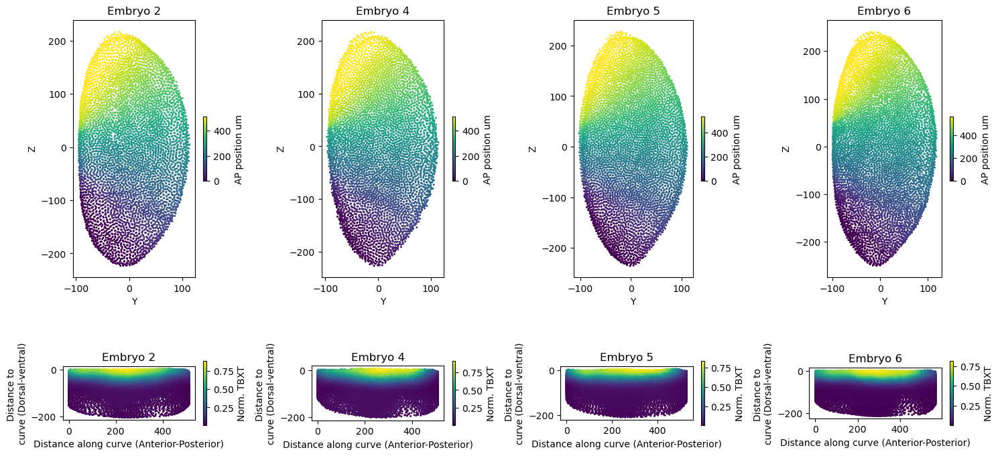

In [16]:
#Calculate the mesoderm-centric view by distnce between the smoothed line and each cell

# Find the distance to the midline as new AP position
z_col = 'Z_rotated'
y_col = 'Y_rotated'
x_col = 'Oriented_X'

for embryo in all_cells['embryo'].unique():
    embryo_cells = all_cells[all_cells['embryo'] == embryo]
    embryo_curve = smoothed_line_all[smoothed_line_all['embryo'] == embryo]

    #Exclude points on curve above and below the points in the embryo
    embryo_curve = embryo_curve[(embryo_curve[x_col] > embryo_cells[x_col].min()) & (embryo_curve[x_col] < embryo_cells[x_col].max())]

    # Calculate distance along the curve
    distance_along_curve = np.cumsum(np.sqrt(np.diff(embryo_curve[x_col])**2 + np.diff(embryo_curve[z_col])**2))
    distance_along_curve = np.insert(distance_along_curve, 0, 0)  # Add starting point

    #Add the distance along the curve to the embryo curve
    embryo_curve['AP_position'] = distance_along_curve
    embryo_curve['DV_position'] = 0

    #Add back into full curve list
    smoothed_line_all.loc[smoothed_line_all['embryo'] == embryo, 'AP_position'] = embryo_curve['AP_position']
    smoothed_line_all.loc[smoothed_line_all['embryo'] == embryo, 'DV_position'] = 0

    # Find the closest point on the curve to each cell
    distance = cdist(embryo_cells[[z_col, x_col]], embryo_curve[[z_col, x_col]])
    arg_min = np.argmin(distance, axis=1)
    min_distance = np.min(distance, axis=1)

    # Make distance negative if the point is below the curve
    below_curve = embryo_cells[z_col].values < embryo_curve[z_col].values[arg_min]
    min_distance[below_curve] = -min_distance[below_curve]

    # Assign distances to the cells
    all_cells.loc[all_cells['embryo'] == embryo, 'AP_position'] = distance_along_curve[arg_min]
    all_cells.loc[all_cells['embryo'] == embryo, 'DV_position'] = min_distance


fig, ax = plt.subplots(2, len(all_cells['embryo'].unique()), figsize=(15, 8))
for idx, embryo in enumerate(all_cells['embryo'].unique()):
    embryo_cells = all_cells[(all_cells['embryo'] == embryo)]


    # Plot
    ax[0, idx].scatter(embryo_cells[z_col], embryo_cells['Oriented_X'], c=embryo_cells['AP_position'], s=1, cmap='viridis')
    ax[0, idx].set_title(f'Embryo {embryo}')
    ax[0, idx].set_aspect('equal')
    ax[0, idx].set_xlabel('Y')
    ax[0, idx].set_ylabel('Z')
    sc = ax[0, idx].scatter(embryo_cells[z_col], embryo_cells['Oriented_X'], c=embryo_cells['AP_position'], s=1, cmap='viridis')
    cbar = plt.colorbar(sc, ax=ax[0, idx], shrink=0.25)
    cbar.set_label('AP position um')  # Add your custom label here

    ax[1, idx].scatter(embryo_cells['AP_position'], embryo_cells['DV_position'], c=embryo_cells[smth_midline_channel], s=1, cmap='viridis')
    ax[1, idx].set_title(f'Embryo {embryo}')
    ax[1, idx].set_xlabel('Distance along curve (Anterior-Posterior)')
    ax[1, idx].set_ylabel('Distance to \ncurve (Dorsal-ventral)')
    ax[1, idx].set_aspect('equal')

    #plot colorbar for TBXT
    sc = ax[1, idx].scatter(embryo_cells['AP_position'], embryo_cells['DV_position'], c=embryo_cells[smth_midline_channel], s=1, cmap='viridis')
    cbar = plt.colorbar(sc, ax=ax[1, idx], shrink=0.25)
    cbar.set_label('Norm. TBXT')  # Add your custom label here


plt.tight_layout()
plt.show()


### Find Left/Right distance from midline

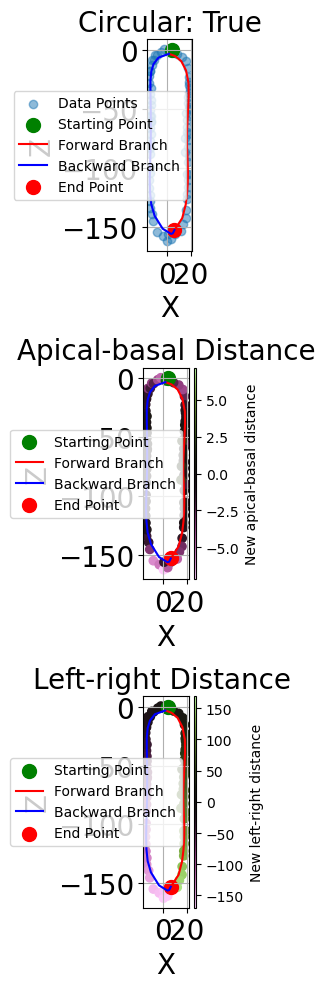

In [17]:
# Test on one slice to optimise parameters

x_col = 'AP_position'
y_col = 'Y_rotated'
z_col = 'DV_position'

#Define the LR flattening class with parameters
LR_flattening_c = LR_flattening(
    h=10, # The distance considered for the local smoother
    step_size=10, # The step size for growing the line
    max_iter=100, # The maximum number of iterations in growing the line 
    tol=0.0001, # The tolerance in variation for stopping the growing
    start_point='custom', # We are providing a custom starting point
    z_col = z_col, # The column with the z-coordinates
    x_col = x_col, # The column with the x-coordinates
    y_col = y_col, # The column with the y-coordinates
    smooth_h=2 # The smoothing parameter for the line after 
    )

# Create and fit the model
embryo = 2
embryo_cells = all_cells[(all_cells['embryo'] == embryo)]
#remove inifinities
embryo_cells = embryo_cells.replace([np.inf, -np.inf], np.nan)
embryo_cells = embryo_cells.dropna(subset=[z_col, y_col])

smoothed_line = smoothed_line_all[smoothed_line_all['embryo'] == embryo]
smoothed_line = smoothed_line.replace([np.inf, -np.inf], np.nan)
smoothed_line = smoothed_line.dropna(subset=[z_col, y_col])

#Use built in function to test slice
curve, distance_analysis = LR_flattening_c.test_slice(embryo_cells, 
                                          smoothed_line, 0,10)

#### 1. Using simle embryo length

Processing Embryo 2
Processing Embryo 4
Processing Embryo 5
Processing Embryo 6
Average time per embryo: 8.10 seconds


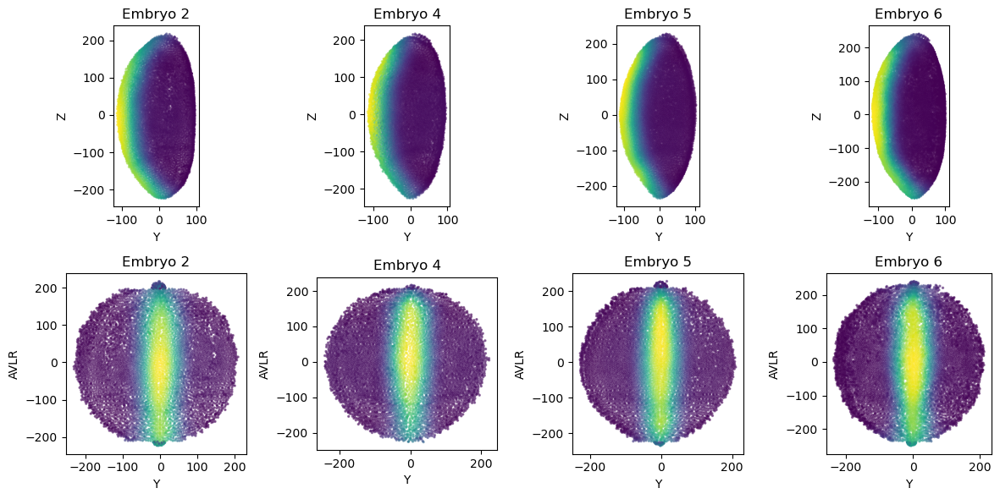

In [18]:
# Flatten the whole embryo - faster version with optimized grouping
x_col = 'Oriented_X'
y_col = 'Y_rotated'
z_col = 'Z_rotated'


step = 12 # don't make this too small as too few cells in each bin will cause issues

#Record time per embryo
time_per_embryo = []

# Iterate over each unique embryo
for idx, embryo in enumerate(all_cells['embryo'].unique()):
    # Initiate timer
    start_time = time.time()
    #
    print(f"Processing Embryo {embryo}")

    # Filter data for current embryo and select relevant columns
    epi_nuc = all_cells[(all_cells['embryo'] == embryo)]
    smoothed_line = smoothed_line_all[smoothed_line_all['embryo'] == embryo]
    # Define binning parameters
    start_point_iter = epi_nuc[x_col].min()
    end_point_iter = epi_nuc[x_col].max()
    
    iterations = np.arange(start_point_iter, end_point_iter + step, step)
    bin_edges = np.append(iterations, iterations[-1] + step)

    # Assign unique IDs and track original index
    epi_nuc['original_index'] = epi_nuc.index
    epi_nuc['new_ID'] = np.arange(len(epi_nuc))
    unique_ids = np.sort(epi_nuc['new_ID'].unique())

    # Select key columns
    epi_nuc = epi_nuc[[z_col, y_col, x_col, 'new_ID', 'original_index']]

    # Apply binning into discrete sections
    epi_nuc['section'] = np.digitize(epi_nuc[x_col], bins=bin_edges) - 1
    smoothed_line['section'] = np.digitize(smoothed_line[x_col], bins=bin_edges) - 1

    # Initialize accumulated data array
    accumulated_array = np.zeros((len(unique_ids), 3))

    # Group data by sections
    grouped_epi = epi_nuc.groupby('section')
    grouped_smoothed = smoothed_line.groupby('section')

    # Initialize columns for analysis
    epi_nuc['AVLR'] = 0
    epi_nuc['New_Z'] = 0

    # Process each section
    no_iterations = len(grouped_epi)
    for counter, (section, sub_slice) in enumerate(grouped_epi, start=1):
        print(f"Section {counter}/{no_iterations}", end='\r')

        # Skip if section not in smoothed data
        if section not in grouped_smoothed.groups:
            continue

        sub_smoothed_line = grouped_smoothed.get_group(section)
        start_point = np.array([sub_smoothed_line[z_col].mean(), sub_smoothed_line[y_col].mean()])

        # Fit LR_flattening class
        LR_flattening_c = LR_flattening(
            h=9, # The distance considered for the local smoother
            step_size=9, # The step size for growing the line
            max_iter=100, # The maximum number of iterations in growing the line 
            tol=0.0001, # The tolerance in variation for stopping the growing
            start_point='custom', # We are providing a custom starting point
            z_col = z_col, # The column with the z-coordinates
            x_col = x_col, # The column with the x-coordinates
            y_col = y_col, # The column with the y-coordinates
            smooth_h=2 # The smoothing parameter for the line after 
            )
        
        # Find LR positions
        curve, distance_analysis = LR_flattening_c.fit_with_branches(sub_slice[[z_col, y_col]], start_point=start_point)

        # Accumulate results
        ids_in_section = sub_slice['new_ID'].values
        accumulated_array[ids_in_section, 0] += distance_analysis['Dist_from_midline'].values
        accumulated_array[ids_in_section, 1] += distance_analysis['intersection_distance'].values
        accumulated_array[ids_in_section, 2] += 1

    # Finalize analysis columns
    epi_nuc['AVLR'] = accumulated_array[:, 0] / accumulated_array[:, 2]
    epi_nuc['New_Z'] = accumulated_array[:, 1] / accumulated_array[:, 2]

    # Map results back to original dataframe
    all_cells.loc[epi_nuc['original_index'], 'AVLR'] = epi_nuc['AVLR'].values
    all_cells.loc[epi_nuc['original_index'], 'New_Z'] = epi_nuc['New_Z'].values

    # Record time
    time_per_embryo.append(time.time() - start_time)

print
print(f"Average time per embryo: {np.mean(time_per_embryo):.2f} seconds")
# Get number of embryos
num_embryos = len(all_cells['embryo'].unique())

# Create plots
fig, ax = plt.subplots(2, num_embryos, figsize=(3 * num_embryos, 6))

# Visualize results
for idx, embryo in enumerate(all_cells['embryo'].unique()):
    temp = all_cells[(all_cells['embryo'] == embryo)]
    ax[0, idx].scatter(temp['Oriented_Y'], temp['Oriented_X'], c=temp[smth_midline_channel], alpha=0.5, s=2)
    ax[0, idx].set_title(f'Embryo {embryo}')
    ax[0, idx].set_xlabel('Y')
    ax[0, idx].set_ylabel('Z')
    ax[0, idx].set_aspect('equal', adjustable='box')

    temp = all_cells[all_cells['embryo'] == embryo]
    ax[1, idx].scatter(temp['AVLR'], temp[x_col], c=temp[smth_midline_channel], alpha=0.5, s=2)
    ax[1, idx].set_title(f'Embryo {embryo}')
    ax[1, idx].set_xlabel('Y')
    ax[1, idx].set_ylabel('AVLR')
    ax[1, idx].set_aspect('equal', adjustable='box')

plt.tight_layout()
plt.show()


#### 2. Using mesoderm-centric view

Processing Embryo 2
Processing Embryo 4
Processing Embryo 5
Processing Embryo 6
Average time per embryo: 9.17 seconds


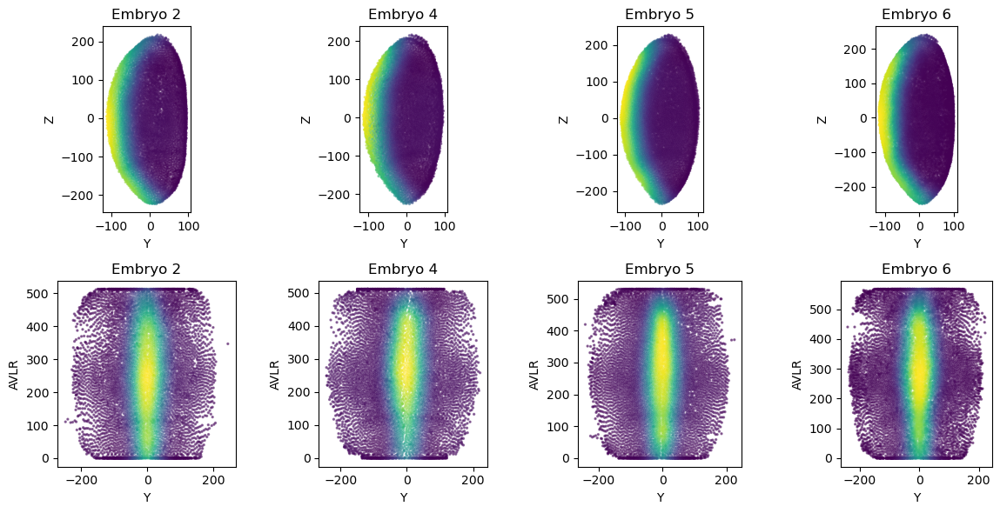

In [19]:
# Flatten the whole embryo - faster version with optimized grouping

x_col = 'AP_position'
y_col = 'Y_rotated'
z_col = 'DV_position'


step = 12 # don't make this too small as too few cells in each bin will cause issues

#Record time per embryo
time_per_embryo = []

# Iterate over each unique embryo
for idx, embryo in enumerate(all_cells['embryo'].unique()):
    # Initiate timer
    start_time = time.time()
    #
    print(f"Processing Embryo {embryo}")

    # Filter data for current embryo and select relevant columns
    epi_nuc = all_cells[(all_cells['embryo'] == embryo)]
    smoothed_line = smoothed_line_all[smoothed_line_all['embryo'] == embryo]
    # Define binning parameters
    start_point_iter = epi_nuc[x_col].min()
    end_point_iter = epi_nuc[x_col].max()
    
    iterations = np.arange(start_point_iter, end_point_iter + step, step)
    bin_edges = np.append(iterations, iterations[-1] + step)


    # Assign unique IDs and track original index
    epi_nuc['original_index'] = epi_nuc.index
    epi_nuc['new_ID'] = np.arange(len(epi_nuc))
    unique_ids = np.sort(epi_nuc['new_ID'].unique())

    # Select key columns
    epi_nuc = epi_nuc[[z_col, y_col, x_col, 'new_ID', 'original_index']]

    # Apply binning into discrete sections
    epi_nuc['section'] = np.digitize(epi_nuc[x_col], bins=bin_edges) - 1
    smoothed_line['section'] = np.digitize(smoothed_line[x_col], bins=bin_edges) - 1

    # Initialize accumulated data array
    accumulated_array = np.zeros((len(unique_ids), 3))

    # Group data by sections
    grouped_epi = epi_nuc.groupby('section')
    grouped_smoothed = smoothed_line.groupby('section')

    # Initialize columns for analysis
    epi_nuc['AVLR'] = 0
    epi_nuc['New_Z'] = 0

    # Process each section
    no_iterations = len(grouped_epi)
    for counter, (section, sub_slice) in enumerate(grouped_epi, start=1):
        print(f"Section {counter}/{no_iterations}", end='\r')

        # Skip if section not in smoothed data
        if section not in grouped_smoothed.groups:
            continue

        sub_smoothed_line = grouped_smoothed.get_group(section)
        start_point = np.array([sub_smoothed_line[z_col].mean(), sub_smoothed_line[y_col].mean()])

        # Fit LR_flattening class
        LR_flattening_c = LR_flattening(
            h=9, # The distance considered for the local smoother
            step_size=9, # The step size for growing the line
            max_iter=100, # The maximum number of iterations in growing the line 
            tol=0.0001, # The tolerance in variation for stopping the growing
            start_point='custom', # We are providing a custom starting point
            z_col = z_col, # The column with the z-coordinates
            x_col = x_col, # The column with the x-coordinates
            y_col = y_col, # The column with the y-coordinates
            smooth_h=2 # The smoothing parameter for the line after 
            )
        
        # Find LR positions
        curve, distance_analysis = LR_flattening_c.fit_with_branches(sub_slice[[z_col, y_col]], start_point=start_point)

        # Accumulate results
        ids_in_section = sub_slice['new_ID'].values
        accumulated_array[ids_in_section, 0] += distance_analysis['Dist_from_midline'].values
        accumulated_array[ids_in_section, 1] += distance_analysis['intersection_distance'].values
        accumulated_array[ids_in_section, 2] += 1

    # Finalize analysis columns
    epi_nuc['AVLR'] = accumulated_array[:, 0] / accumulated_array[:, 2]
    epi_nuc['New_Z'] = accumulated_array[:, 1] / accumulated_array[:, 2]

    # Map results back to original dataframe
    all_cells.loc[epi_nuc['original_index'], 'AVLR_dv'] = epi_nuc['AVLR'].values
    all_cells.loc[epi_nuc['original_index'], 'New_Z_dv'] = epi_nuc['New_Z'].values

    # Record time
    time_per_embryo.append(time.time() - start_time)

print
print(f"Average time per embryo: {np.mean(time_per_embryo):.2f} seconds")
# Get number of embryos
num_embryos = len(all_cells['embryo'].unique())

# Create plots
fig, ax = plt.subplots(2, num_embryos, figsize=(3 * num_embryos, 6))

# Visualize results
for idx, embryo in enumerate(all_cells['embryo'].unique()):
    temp = all_cells[(all_cells['embryo'] == embryo)]
    ax[0, idx].scatter(temp['Oriented_Y'], temp['Oriented_X'], c=temp[smth_midline_channel], alpha=0.5, s=2)
    ax[0, idx].set_title(f'Embryo {embryo}')
    ax[0, idx].set_xlabel('Y')
    ax[0, idx].set_ylabel('Z')
    ax[0, idx].set_aspect('equal', adjustable='box')

    temp = all_cells[all_cells['embryo'] == embryo]
    ax[1, idx].scatter(temp['AVLR_dv'], temp[x_col], c=temp[smth_midline_channel], alpha=0.5, s=2)
    ax[1, idx].set_title(f'Embryo {embryo}')
    ax[1, idx].set_xlabel('Y')
    ax[1, idx].set_ylabel('AVLR')
    ax[1, idx].set_aspect('equal', adjustable='box')

plt.tight_layout()
plt.show()


## 2. Normalise to each other

### Relative maps

1. For view 1

Embryo 2
Embryo 4
Embryo 5
Embryo 6


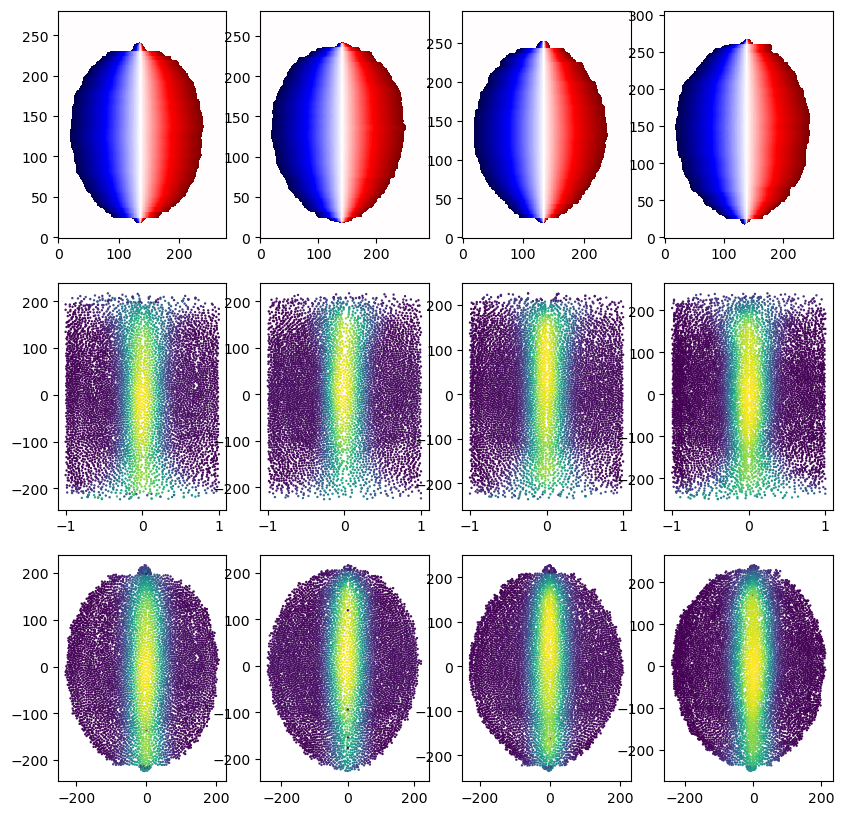

In [20]:
# Find the relative map

#Find relaitve position of each cell from the midline to the edge per AP positions
# Chick epiblast inference isn't perfect, so we'll smooth the edges location a bit

fig, ax = plt.subplots(3, 4, figsize=(10, 10))

downscaler = 2
for idx, embryo in enumerate(all_cells['embryo'].unique()):
    print(f"Embryo {embryo}")
    epi_nuc = all_cells[(all_cells['embryo'] == embryo)]
    indexes = epi_nuc.index
    epi_nuc['original_index'] = indexes
    #remove cells with no neighbors

    # Normalize AVLR and Oriented_X to positive values to fill in image
    midline = epi_nuc['AVLR'].min()
    epi_nuc['AVLR_pos'] = epi_nuc['AVLR'] - midline
    epi_nuc['Oriented_X_pos'] = epi_nuc['Oriented_X'] - epi_nuc['Oriented_X'].min()

    # Remove NaNs together to avoid mismatched lengths
    epi_nuc_clean = epi_nuc.dropna(subset=['AVLR_pos', 'Oriented_X_pos'])

    # Convert to image coordinates (add 50 pixel buffer)

    pix_buffer = 20
    LR_coords = ((epi_nuc_clean['AVLR_pos'] / downscaler).astype(int).values + pix_buffer).astype(int)
    X_coords = ((epi_nuc_clean['Oriented_X_pos'] / downscaler).astype(int).values+ pix_buffer).astype(int)

    # Create a blank image
    img = np.zeros((LR_coords.max() + int(pix_buffer*2), X_coords.max() + int(pix_buffer*2)))

    # Fill in the image for outline mask
    img[LR_coords, X_coords] = 1

    # Fill in small gaps in the mask
    img_filled = ski.morphology.binary_closing(img, ski.morphology.disk(3))

    #Smooth the img then otsu threshold to find outline
    img_filled = ski.filters.gaussian(img_filled, sigma = 2, mode = 'reflect')
    img_filled = img_filled > ski.filters.threshold_li(img_filled)

    # Midline converted into image coordinates
    midline_img = (abs(midline) / downscaler) + pix_buffer

    # Initialize the relative map and absolute map
    rel_map = np.zeros_like(img_filled, dtype=float)
    abs_map = np.zeros_like(img_filled, dtype=float)

    # Loop through each X column in image
    for x in range(img_filled.shape[1]):
        column = img_filled[:, x]
        
        # Skip empty columns
        if column.sum() == 0:
            continue
        
        # Top and bottom outlines
        top = np.argmax(column)
        bottom = len(column) - np.argmax(column[::-1]) - 1

        # Relative positions  and abs (in downscaled pixels) from midline
        for y in range(top, bottom + 1):
            if y < midline_img:
                rel_map[y, x] = (y - midline_img) / (midline_img - top) if midline_img != top else 0
                abs_map[y, x] = (y - midline_img)
            else:
                rel_map[y, x] = (y - midline_img) / (bottom - midline_img) if bottom != midline_img else 0
                abs_map[y, x] = (y - midline_img)

    # # Display the relative map
    ax[0, idx].imshow(rel_map.T, cmap='seismic', aspect='auto', vmin=-1, vmax=1, interpolation='none',
                      origin='lower')

    rel_map[~img_filled] = np.nan
    # Resize rel_map by a factor of the downscaler
    rel_map = resize(rel_map, (rel_map.shape[0] * downscaler, rel_map.shape[1] * downscaler), order=0, anti_aliasing=False)
    # rel_map = ski.filters.gaussian(rel_map, sigma = 1)

    # Resize abs_map by a factor of the downscaler
    abs_map = resize(abs_map, (abs_map.shape[0] * downscaler, abs_map.shape[1] * downscaler), order=0, anti_aliasing=False)* downscaler
    # abs_map = ski.filters.gaussian(abs_map, sigma = 1) * downscaler


    # # extract abs points for edges of relative map
    # l_outline = np.where(rel_map> 0.99)[0][0]


    # Convert positions to the resized image scale
    AVLR_scaled = (epi_nuc_clean['AVLR_pos']).astype(int).values + pix_buffer*downscaler
    X_scaled = (epi_nuc_clean['Oriented_X_pos']).astype(int).values + pix_buffer*downscaler

    #Store indexes of points outside the image
    outside_idx = np.where((AVLR_scaled > rel_map.shape[0] - 1) | (X_scaled > rel_map.shape[1] - 1))[0]

    # Ensure coordinates don’t go out of bounds
    AVLR_scaled = np.clip(AVLR_scaled, 0, rel_map.shape[0] - 1)
    X_scaled = np.clip(X_scaled, 0, rel_map.shape[1] - 1)

    # Assign relative map values back into epi_nuc
    epi_nuc.loc[epi_nuc_clean.index, 'Rel_position'] = rel_map[AVLR_scaled, X_scaled]
    epi_nuc.loc[epi_nuc_clean.index, 'Abs_position'] = abs_map[AVLR_scaled, X_scaled] 

    #set points outside the image to nan
    epi_nuc.loc[epi_nuc_clean.index[outside_idx], 'Rel_position'] = np.nan
    epi_nuc.loc[epi_nuc_clean.index[outside_idx], 'Abs_position'] = np.nan

    #Set points with AVLR > 0 but Rel_position = 0 to nan
    epi_nuc.loc[(epi_nuc['AVLR'] > 0) & (abs(epi_nuc['Rel_position']) < 0.01), 'Rel_position'] = np.nan
    epi_nuc.loc[(epi_nuc['AVLR'] > 0) & (abs(epi_nuc['Rel_position']) < 0.01), 'Abs_position'] = np.nan

    # Display the relative map
    ax[1, idx].scatter(epi_nuc['Rel_position'], epi_nuc['Oriented_X'], c = epi_nuc[smth_midline_channel],s=0.5)
    ax[2, idx].scatter(epi_nuc['Abs_position'], epi_nuc['Oriented_X'], c = epi_nuc[smth_midline_channel],s=0.5)

    all_cells.loc[epi_nuc['original_index'], 'Rel_LR_position'] = epi_nuc['Rel_position'].values
    


#### For view 2

Embryo 2
Embryo 4
Embryo 5
Embryo 6


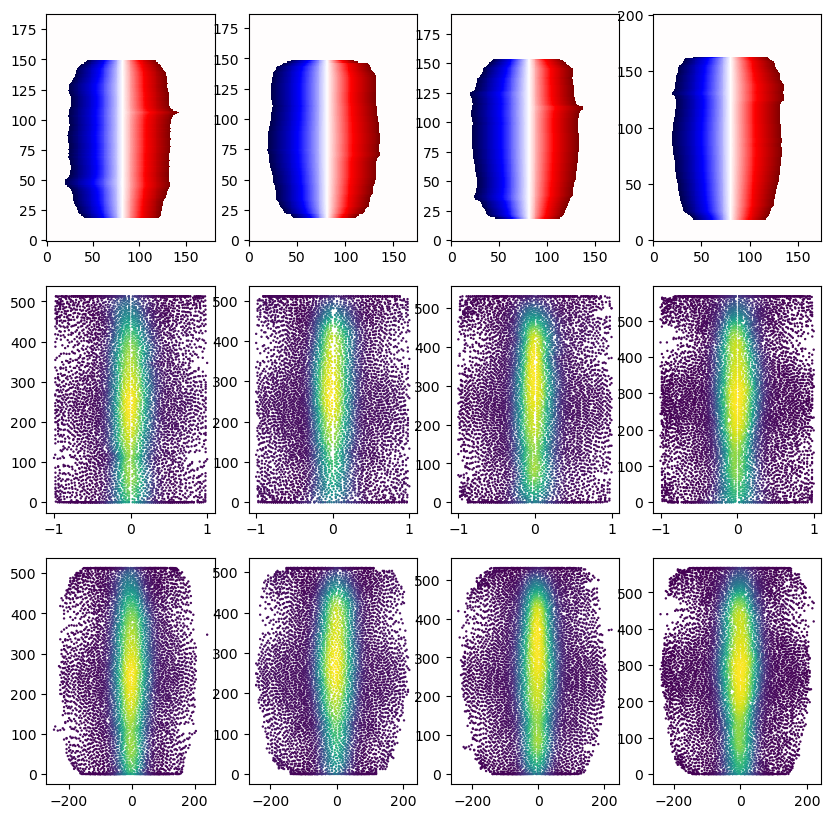

In [21]:
# Find the relative map

#Find relaitve position of each cell from the midline to the edge per AP positions
# Chick epiblast inference isn't perfect, so we'll smooth the edges location a bit

fig, ax = plt.subplots(3, 4, figsize=(10, 10))

downscaler = 4
for idx, embryo in enumerate(all_cells['embryo'].unique()):
    print(f"Embryo {embryo}")
    epi_nuc = all_cells[(all_cells['embryo'] == embryo)]
    indexes = epi_nuc.index
    epi_nuc['original_index'] = indexes
    #remove cells with no neighbors

    # Normalize AVLR and Oriented_X to positive values to fill in image
    midline = epi_nuc['AVLR_dv'].min()
    epi_nuc['AVLR_pos'] = epi_nuc['AVLR_dv'] - midline
    epi_nuc['Oriented_X_pos'] = epi_nuc['AP_position'] - epi_nuc['AP_position'].min()

    # Remove NaNs together to avoid mismatched lengths
    epi_nuc_clean = epi_nuc.dropna(subset=['AVLR_pos', 'Oriented_X_pos'])

    # Convert to image coordinates (add 50 pixel buffer)

    pix_buffer = 20
    LR_coords = ((epi_nuc_clean['AVLR_pos'] / downscaler).astype(int).values + pix_buffer).astype(int)
    X_coords = ((epi_nuc_clean['Oriented_X_pos'] / downscaler).astype(int).values+ pix_buffer).astype(int)

    # Create a blank image
    img = np.zeros((LR_coords.max() + int(pix_buffer*2), X_coords.max() + int(pix_buffer*2)))

    # Fill in the image for outline mask
    img[LR_coords, X_coords] = 1

    # Fill in small gaps in the mask
    img_filled = ski.morphology.binary_closing(img, ski.morphology.disk(10))

    #Smooth the img then otsu threshold to find outline
    img_filled = ski.filters.gaussian(img_filled, sigma = 1, mode = 'reflect')

    img_filled = img_filled > ski.filters.threshold_li(img_filled)

    # Midline converted into image coordinates
    midline_img = (abs(midline) / downscaler) + pix_buffer

    # Initialize the relative map and absolute map
    rel_map = np.zeros_like(img_filled, dtype=float)
    abs_map = np.zeros_like(img_filled, dtype=float)

    # Loop through each X column in image
    for x in range(img_filled.shape[1]):
        column = img_filled[:, x]
        
        # Skip empty columns
        if column.sum() == 0:
            continue
        
        # Top and bottom outlines
        top = np.argmax(column)
        bottom = len(column) - np.argmax(column[::-1]) - 1

        # Relative positions  and abs (in downscaled pixels) from midline
        for y in range(top, bottom + 1):
            if y < midline_img:
                rel_map[y, x] = (y - midline_img) / (midline_img - top) if midline_img != top else 0
                abs_map[y, x] = (y - midline_img)
            else:
                rel_map[y, x] = (y - midline_img) / (bottom - midline_img) if bottom != midline_img else 0
                abs_map[y, x] = (y - midline_img)

    # # Display the relative map
    ax[0, idx].imshow(rel_map.T, cmap='seismic', aspect='auto', vmin=-1, vmax=1, interpolation='none',
                      origin='lower')

    rel_map[~img_filled] = np.nan
    # Resize rel_map by a factor of the downscaler
    rel_map = resize(rel_map, (rel_map.shape[0] * downscaler, rel_map.shape[1] * downscaler), order=0, anti_aliasing=False)
    # rel_map = ski.filters.gaussian(rel_map, sigma = 1)

    # Resize abs_map by a factor of the downscaler
    abs_map = resize(abs_map, (abs_map.shape[0] * downscaler, abs_map.shape[1] * downscaler), order=0, anti_aliasing=False)* downscaler
    # abs_map = ski.filters.gaussian(abs_map, sigma = 1) * downscaler


    # # extract abs points for edges of relative map
    # l_outline = np.where(rel_map> 0.99)[0][0]


    # Convert positions to the resized image scale
    AVLR_scaled = (epi_nuc_clean['AVLR_pos']).astype(int).values + pix_buffer*downscaler
    X_scaled = (epi_nuc_clean['Oriented_X_pos']).astype(int).values + pix_buffer*downscaler

    #Store indexes of points outside the image
    outside_idx = np.where((AVLR_scaled > rel_map.shape[0] - 1) | (X_scaled > rel_map.shape[1] - 1))[0]

    # Ensure coordinates don’t go out of bounds
    AVLR_scaled = np.clip(AVLR_scaled, 0, rel_map.shape[0] - 1)
    X_scaled = np.clip(X_scaled, 0, rel_map.shape[1] - 1)

    # Assign relative map values back into epi_nuc
    epi_nuc.loc[epi_nuc_clean.index, 'Rel_position'] = rel_map[AVLR_scaled, X_scaled]
    epi_nuc.loc[epi_nuc_clean.index, 'Abs_position'] = abs_map[AVLR_scaled, X_scaled] 

    #set points outside the image to nan
    epi_nuc.loc[epi_nuc_clean.index[outside_idx], 'Rel_position'] = np.nan
    epi_nuc.loc[epi_nuc_clean.index[outside_idx], 'Abs_position'] = np.nan

    #Set points with AVLR > 0 but Rel_position = 0 to nan
    epi_nuc.loc[(epi_nuc['AVLR_dv'] > 0) & (abs(epi_nuc['Rel_position']) < 0.01), 'Rel_position'] = np.nan
    epi_nuc.loc[(epi_nuc['AVLR_dv'] > 0) & (abs(epi_nuc['Rel_position']) < 0.01), 'Abs_position'] = np.nan

    # Display the relative map
    ax[1, idx].scatter(epi_nuc['Rel_position'], epi_nuc['AP_position'], c = epi_nuc[smth_midline_channel],s=0.5)
    ax[2, idx].scatter(epi_nuc['Abs_position'], epi_nuc['AP_position'], c = epi_nuc[smth_midline_channel],s=0.5)

    all_cells.loc[epi_nuc['original_index'], 'Rel_LR_position_dv'] = epi_nuc['Rel_position'].values
    


#### Find relative and scaled positions of AP axis for both views

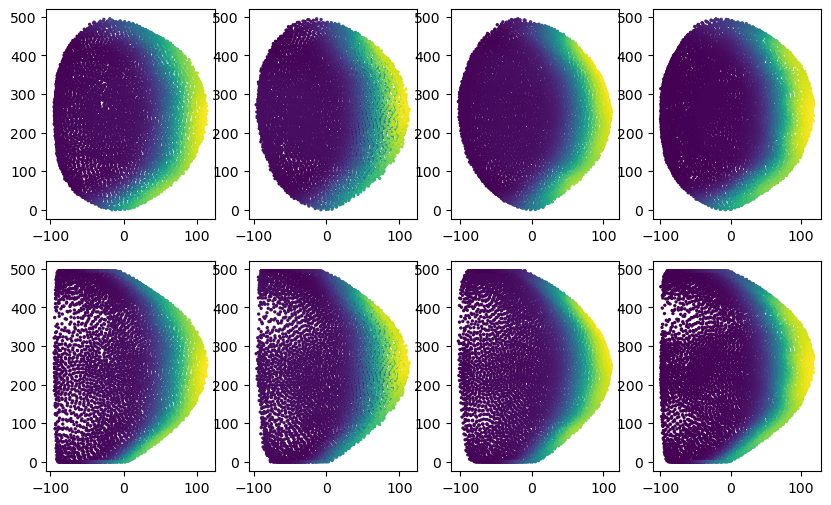

In [22]:
#Find relative anterior-posterior position of each cell for each embryo and smoothed line

embryo_lengths = []
for embryo in smoothed_line_all['embryo'].unique():

    temp_embryo = all_cells[all_cells['embryo'] == embryo]
    temp = smoothed_line_all[smoothed_line_all['embryo'] == embryo]

    # FInd the relative AP position of each cell for option 1
    embryo_max = temp_embryo['Oriented_X'].max()
    embryo_min = temp_embryo['Oriented_X'].min()
    
    temp['Rel_AP_position'] = (temp['Oriented_X'] - embryo_min) / (embryo_max - embryo_min)
    temp_embryo['Rel_AP_position'] = (temp_embryo['Oriented_X'] - embryo_min) / (embryo_max - embryo_min)

    #store the embryo length
    all_cells.loc[all_cells['embryo'] == embryo, 'Rel_AP_position'] = temp_embryo['Rel_AP_position']
    smoothed_line_all.loc[smoothed_line_all['embryo'] == embryo, 'Rel_AP_position'] = temp['Rel_AP_position']
    embryo_lengths.append(abs(embryo_max- embryo_min))

    embryo_max = temp_embryo['AP_position'].max()
    embryo_min = temp_embryo['AP_position'].min()
    
    temp['Rel_AP_position_dv'] = (temp['AP_position'] - embryo_min) / (embryo_max - embryo_min)
    temp_embryo['Rel_AP_position_dv'] = (temp_embryo['AP_position'] - embryo_min) / (embryo_max - embryo_min)

    #store the embryo length
    all_cells.loc[all_cells['embryo'] == embryo, 'Rel_AP_position_dv'] = temp_embryo['Rel_AP_position_dv']
    smoothed_line_all.loc[smoothed_line_all['embryo'] == embryo, 'Rel_AP_position_dv'] = temp['Rel_AP_position_dv']
    embryo_lengths.append(abs(embryo_max- embryo_min))

all_cells['Scaled_Rel_AP_position'] = all_cells['Rel_AP_position'] * np.mean(embryo_lengths)
all_cells['Scaled_Rel_AP_position_dv'] = all_cells['Rel_AP_position_dv'] * np.mean(embryo_lengths)



fig, ax = plt.subplots(2, 4, figsize=(10, 6))
for idx, embryo in enumerate(smoothed_line_all['embryo'].unique()):
    temp_embryo = all_cells[all_cells['embryo'] == embryo]
    # temp = smoothed_line_all[smoothed_line_all['embryo'] == embryo]
    ax[0, idx].scatter(temp_embryo['Z_rotated'], temp_embryo['Scaled_Rel_AP_position'], c=temp_embryo[smth_midline_channel], s=2)

    ax[1, idx].scatter(temp_embryo['Z_rotated'], temp_embryo['Scaled_Rel_AP_position_dv'], c=temp_embryo[smth_midline_channel], s=2)
    # ax[idx].plot(temp['Z_rotated'], temp['Rel_Y'], 'r-')  # Smoothed curve


### Caluclate average LR distances per AP position for both views

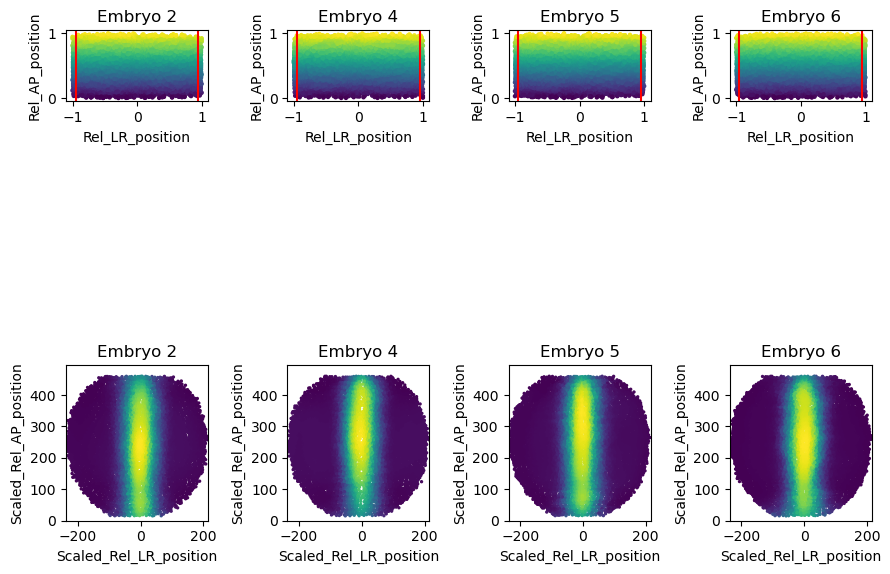

In [23]:
#Choose the column to use for the AP axis
y_col = 'Rel_AP_position'

# Left-right limits
LR_limits = 0.95

# Binning
binsize = 0.01
bins = np.arange(all_cells[y_col].min(), all_cells[y_col].max(), binsize)
all_cells['binned'] = np.digitize(all_cells[y_col], bins)


l_means, r_means = compute_mean_edge_position(all_cells, 
                                              embryo_id = 'embryo', 
                                               LR_limit = LR_limits)


# scale left and right values to the mean values per bin
all_cells.loc[(all_cells['Rel_LR_position'] > 0), 'mean_Abss'] = all_cells.loc[(all_cells['Rel_LR_position'] > 0) , 'binned'].map(l_means['mean_Abss'])
all_cells.loc[(all_cells['Rel_LR_position'] < 0), 'mean_Abss'] = all_cells.loc[(all_cells['Rel_LR_position'] < 0) , 'binned'].map(r_means['mean_Abss'])

# Scale the values by the threshold
all_cells['Scaled_Rel_LR_position'] = all_cells['mean_Abss'] * abs(all_cells['Rel_LR_position'])

#Divide by the threshold to account for loss of distance
all_cells['Scaled_Rel_LR_position'] = all_cells['Scaled_Rel_LR_position'] / LR_limits


fig, ax = plt.subplots(2, len(all_cells['embryo'].unique()), figsize=(9, 9))
for idx, embryo in enumerate(all_cells['embryo'].unique()):
    temp = all_cells[(all_cells['embryo'] == embryo)]
    ax[0,idx].scatter(temp['Rel_LR_position'], temp[y_col], c=temp['binned'], s=5)
    ax[0,idx].set_title(f'Embryo {embryo}') 
    ax[0,idx].set_xlabel('Rel_LR_position')
    ax[0,idx].set_ylabel('Rel_AP_position')
    ax[0,idx].set_aspect('equal')

    #show thresholda
    ax[0,idx].axvline(x=LR_limits, color='r')
    ax[0,idx].axvline(x=-LR_limits, color='r')

    ax[1, idx].scatter(temp['Scaled_Rel_LR_position'], temp['Scaled_Rel_AP_position'], c=temp[smth_midline_channel], s=2)
    ax[1, idx].set_title(f'Embryo {embryo}')
    ax[1, idx].set_xlabel('Scaled_Rel_LR_position')
    ax[1, idx].set_ylabel('Scaled_Rel_AP_position')
    ax[1, idx].set_aspect('equal')

    #enforce limits from whole dataset
    xlim = all_cells['Scaled_Rel_LR_position'].min(), all_cells['Scaled_Rel_LR_position'].max()
    ylim = all_cells['Scaled_Rel_AP_position'].min(), all_cells['Scaled_Rel_AP_position'].max()

    ax[1, idx].set_xlim(xlim)
    ax[1, idx].set_ylim(ylim)
    
plt.tight_layout()
plt.show()

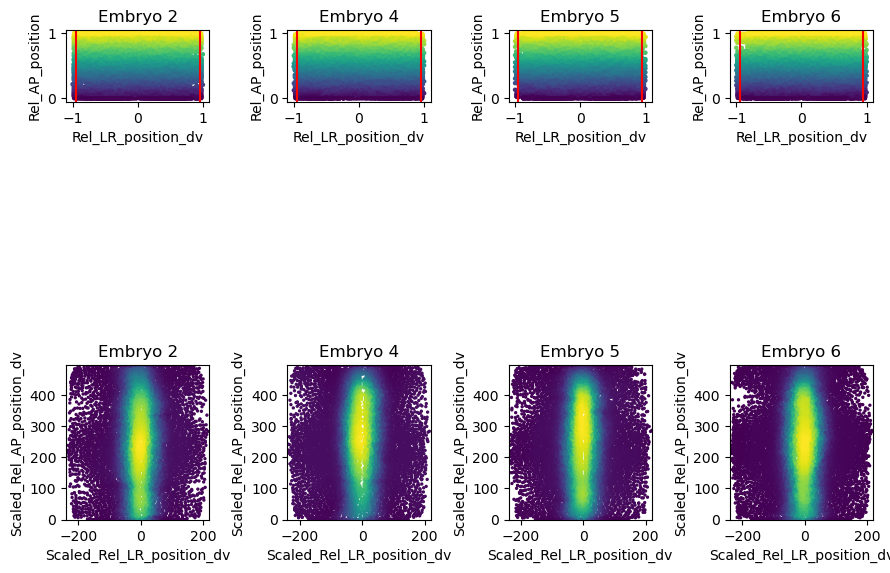

In [24]:
#Choose the column to use for the AP axis
y_col = 'Rel_AP_position_dv'

# Left-right limits
LR_limits = 0.95

# Binning
binsize = 0.01
bins = np.arange(all_cells[y_col].min(), all_cells[y_col].max(), binsize)
all_cells['binned'] = np.digitize(all_cells[y_col], bins)


l_means, r_means = compute_mean_edge_position(all_cells, 
                                              embryo_id = 'embryo', 
                                               LR_limit = LR_limits)


# scale left and right values to the mean values per bin
all_cells.loc[(all_cells['Rel_LR_position_dv'] > 0), 'mean_Abss'] = all_cells.loc[(all_cells['Rel_LR_position_dv'] > 0) , 'binned'].map(l_means['mean_Abss'])
all_cells.loc[(all_cells['Rel_LR_position_dv'] < 0), 'mean_Abss'] = all_cells.loc[(all_cells['Rel_LR_position_dv'] < 0) , 'binned'].map(r_means['mean_Abss'])

# Scale the values by the threshold
all_cells['Scaled_Rel_LR_position_dv'] = all_cells['mean_Abss'] * abs(all_cells['Rel_LR_position_dv'])

#Divide by the threshold to account for loss of distance
all_cells['Scaled_Rel_LR_position_dv'] = all_cells['Scaled_Rel_LR_position_dv'] / LR_limits


fig, ax = plt.subplots(2, len(all_cells['embryo'].unique()), figsize=(9, 9))
for idx, embryo in enumerate(all_cells['embryo'].unique()):
    temp = all_cells[(all_cells['embryo'] == embryo)]
    ax[0,idx].scatter(temp['Rel_LR_position_dv'], temp[y_col], c=temp['binned'], s=5)
    ax[0,idx].set_title(f'Embryo {embryo}') 
    ax[0,idx].set_xlabel('Rel_LR_position_dv')
    ax[0,idx].set_ylabel('Rel_AP_position')
    ax[0,idx].set_aspect('equal')

    #show thresholda
    ax[0,idx].axvline(x=LR_limits, color='r')
    ax[0,idx].axvline(x=-LR_limits, color='r')

    ax[1, idx].scatter(temp['Scaled_Rel_LR_position_dv'], temp['Scaled_Rel_AP_position_dv'], c=temp[smth_midline_channel], s=2)
    ax[1, idx].set_title(f'Embryo {embryo}')
    ax[1, idx].set_xlabel('Scaled_Rel_LR_position_dv')
    ax[1, idx].set_ylabel('Scaled_Rel_AP_position_dv')
    ax[1, idx].set_aspect('equal')

    #enforce limits from whole dataset
    xlim = all_cells['Scaled_Rel_LR_position_dv'].min(), all_cells['Scaled_Rel_LR_position_dv'].max()
    ylim = all_cells['Scaled_Rel_AP_position_dv'].min(), all_cells['Scaled_Rel_AP_position_dv'].max()

    ax[1, idx].set_xlim(xlim)
    ax[1, idx].set_ylim(ylim)
    
plt.tight_layout()
plt.show()

## Example plots

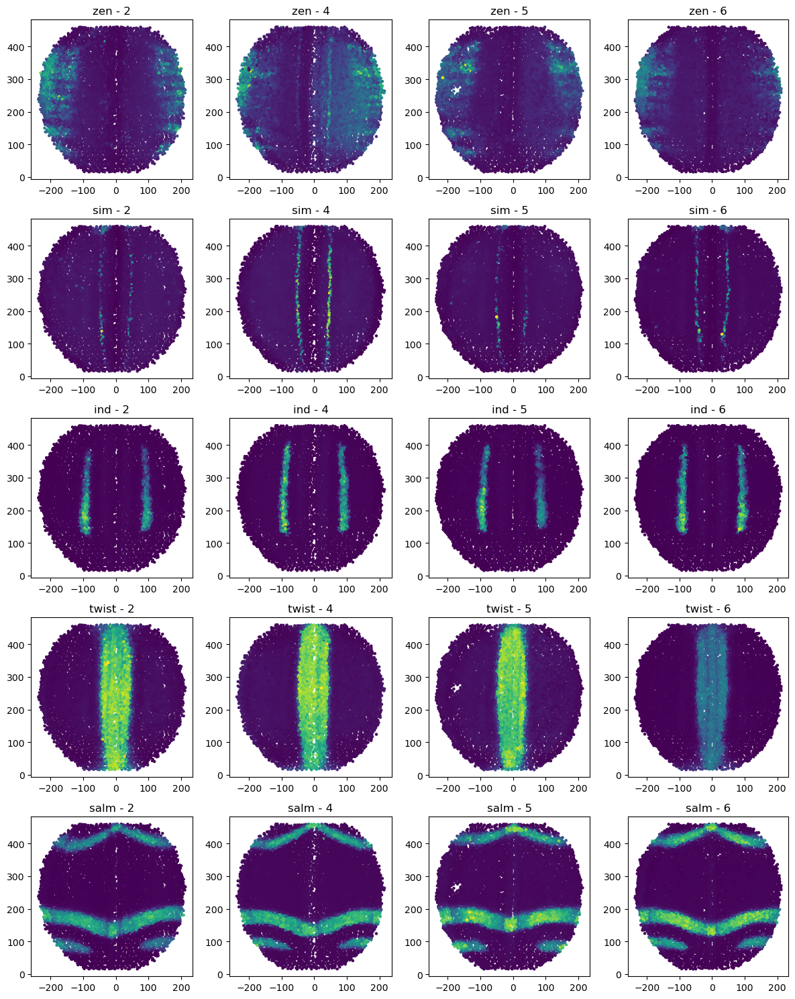

In [25]:
chanel_names = ['zen','sim', 'ind', 'twist', 'salm']    

# Normalise fluorescence values
fig, ax = plt.subplots(len(chanel_names), len(all_cells['embryo'].unique()), figsize=(12, 15), squeeze=False)

for idx, embryo in enumerate(all_cells['embryo'].unique()):

    for i, channel in enumerate(chanel_names):
        embryo_cells = all_cells[all_cells['embryo'] == embryo]

        if not embryo_cells.empty:

            # Scatter plot
            scatter = ax[i, idx].scatter(
                embryo_cells['Scaled_Rel_LR_position'],
                embryo_cells['Scaled_Rel_AP_position'],
                c=embryo_cells[f'{channel}'],
                s=5
            )

            ax[i, idx].set_title(f'{channel} - {embryo}')
            ax[i, idx].set_aspect('equal', 'box')

plt.tight_layout()
plt.show()


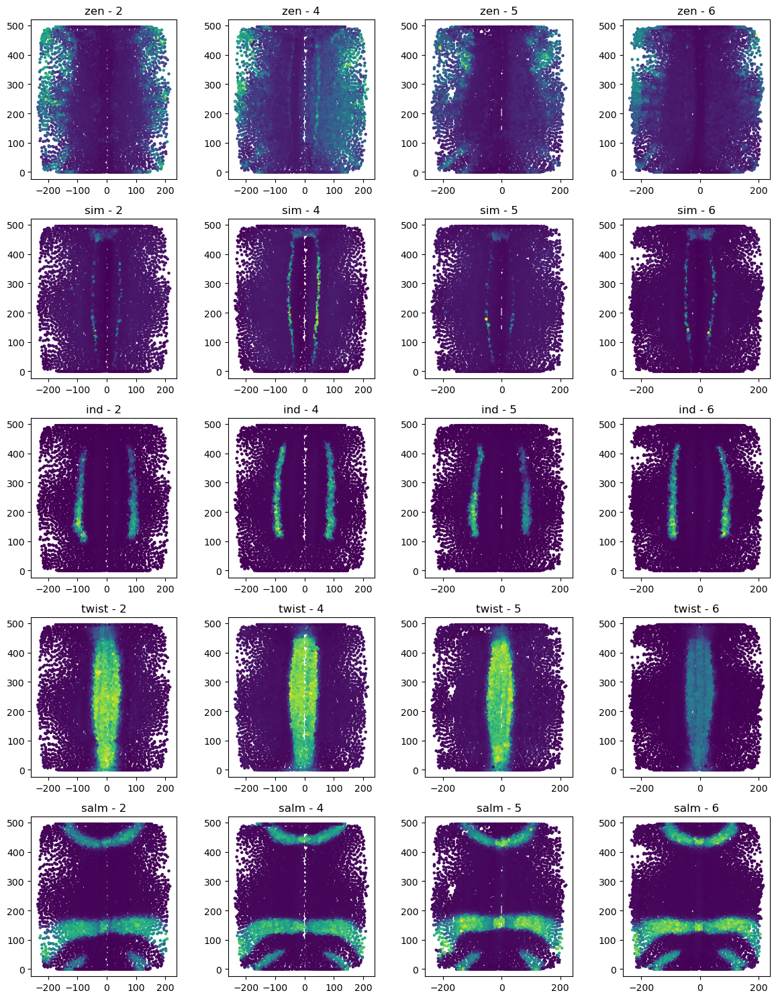

In [26]:
chanel_names = ['zen','sim', 'ind', 'twist', 'salm']    

# Normalise fluorescence values
fig, ax = plt.subplots(len(chanel_names), len(all_cells['embryo'].unique()), figsize=(12, 15), squeeze=False)

for idx, embryo in enumerate(all_cells['embryo'].unique()):

    for i, channel in enumerate(chanel_names):
        embryo_cells = all_cells[all_cells['embryo'] == embryo]

        if not embryo_cells.empty:

            # Scatter plot
            scatter = ax[i, idx].scatter(
                embryo_cells['Scaled_Rel_LR_position_dv'],
                embryo_cells['Scaled_Rel_AP_position_dv'],
                c=embryo_cells[f'{channel}'],
                s=5
            )

            ax[i, idx].set_title(f'{channel} - {embryo}')
            ax[i, idx].set_aspect('equal', 'box')

plt.tight_layout()
plt.show()


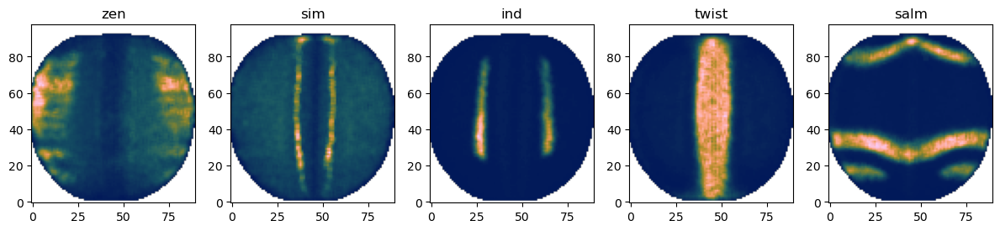

In [ ]:
# Filter epiblast cells
epi_nuc = all_cells.copy()


# Scale position coordinates
ant_limit = abs(epi_nuc['Scaled_Rel_AP_position'].min())
LR_mid = abs(epi_nuc['Scaled_Rel_LR_position'].min())

#Store the length scales
PS_length = epi_nuc['Scaled_Rel_AP_position'].max()
LR_length = epi_nuc['Scaled_Rel_LR_position'].max() + abs(epi_nuc['Scaled_Rel_LR_position'].min())

epi_nuc['Scaled_Rel_AP_position'] -= epi_nuc['Scaled_Rel_AP_position'].min()
epi_nuc['Scaled_Rel_LR_position'] -= epi_nuc['Scaled_Rel_LR_position'].min()

# Configuration settings
x_col, y_col = 'Scaled_Rel_LR_position', 'Scaled_Rel_AP_position'
channels = ['zen','sim', 'ind', 'twist', 'salm']   

embryos = all_cells['embryo'].unique()
scale, pad, ant_cut = 5, 20, 0
img_shape = (int(epi_nuc[x_col].max() / scale), int(epi_nuc[y_col].max() / scale))
LR_mid, ant_limit = int(LR_mid / scale), (ant_limit // scale) - ant_cut
post_lim = int(epi_nuc[y_col].max() / scale) - ant_cut
APmid = post_lim - ant_limit

# Initialize storage
avg_imgs = {channel: np.zeros(img_shape) for channel in channels}
counts = {channel: np.zeros(img_shape) for channel in channels}
all_counts = np.zeros(img_shape)
SOX2TBRAcounts = np.zeros(img_shape)
SOX2TBRA_outlines = []
fp_size = 3
footprint = np.ones((fp_size, fp_size))

# Process each embryo
for embryo in embryos:
    temp = epi_nuc[epi_nuc['embryo'] == embryo].copy().dropna(subset=[x_col, y_col] + channels)

    # Bin and average channel data
    x_bins, y_bins = (temp[x_col] / scale).astype(int), (temp[y_col] / scale).astype(int)
    np.add.at(all_counts, (x_bins-1, y_bins-1), 1)

    for channel in channels:
        img, count = np.zeros(img_shape), np.zeros(img_shape)
        np.add.at(img, (x_bins-1, y_bins-1), temp[channel])
        np.add.at(count, (x_bins-1, y_bins-1), 1)
        valid = count > 0
        img[valid] /= count[valid]
        avg_imgs[channel] += img
        counts[channel] += valid

# Finalize averages
for channel in channels:
    valid = counts[channel] > 0
    avg_imgs[channel][valid] /= len(embryos)

# Create epiblast mask
mask_zero = np.pad(all_counts > 0, ((pad, pad), (pad, pad)), constant_values=0)
mask_zero = ski.filters.gaussian(mask_zero, sigma=6) > 0.4
mask_zero = mask_zero.T

#Store images for later
channel_imgs = []

# Display channel images
fig, axes = plt.subplots(1, len(channels), figsize=(12, 4))
for idx, channel in enumerate(channels):
    image = np.pad(avg_imgs[channel].T, ((pad, pad), (pad, pad)), constant_values=0)
    image = ski.exposure.rescale_intensity(image, in_range='image', out_range=(0, 1))
    image = ski.filters.rank.mean_bilateral(image, footprint=footprint, s0=500, s1=500).astype(float)


    image[~mask_zero] = np.nan
    image = image[ant_cut:][pad:-pad, pad:-pad]

    channel_imgs.append(image)

    axes[idx].imshow(image, origin='lower', cmap=cmc.batlow)
    axes[idx].set_title(channel)

plt.tight_layout()

plt.show()

#remove padding of the mask and cut
mask_zero = mask_zero[ant_cut:]
mask_zero = mask_zero[pad:-pad, pad:-pad]


Text(0, 0.5, 'Relative AP position (um)')

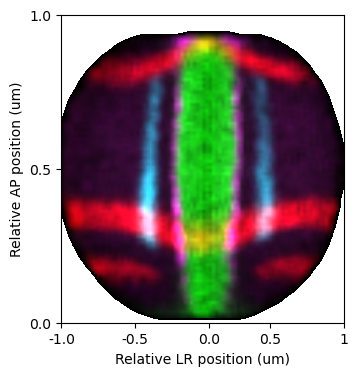

In [ ]:
channel1, channel2, channel3, channel4, channel5 = channel_imgs

#resized image 
channel1 = ski.transform.rescale(channel1, 20, anti_aliasing=True)
channel2 = ski.transform.rescale(channel2, 20, anti_aliasing=True)
channel3 = ski.transform.rescale(channel3, 20, anti_aliasing=True)
channel4 = ski.transform.rescale(channel4, 20, anti_aliasing=True)
channel5 = ski.transform.rescale(channel5, 20, anti_aliasing=True)

mask_zero_resc = ski.transform.rescale(mask_zero, 20)

#smooth the mask
mask_zero_resc = ski.filters.gaussian(mask_zero_resc, sigma=30, mode='constant', cval=0)
mask_zero_resc = mask_zero_resc > 0.5

#Set nans to 0
channel1[np.isnan(channel1)] = 0
channel2[np.isnan(channel2)] = 0
channel3[np.isnan(channel3)] = 0
channel4[np.isnan(channel4)] = 0
channel5[np.isnan(channel5)] = 0

channel1[~mask_zero_resc] = np.nan
channel2[~mask_zero_resc] = np.nan
channel3[~mask_zero_resc] = np.nan
channel4[~mask_zero_resc] = np.nan
channel5[~mask_zero_resc] = np.nan

#Set mask where image is nan
maskNan = np.isnan(channel1)

# #Digitize the image channels into 10 bins if wanted

# bins = 8
# channel1 = np.digitize(channel1, np.linspace(np.nanmin(channel1), np.nanmax(channel1),bins)).astype(float)
# channel2 = np.digitize(channel2, np.linspace(np.nanmin(channel2), np.nanmax(channel2), bins)).astype(float)
# channel3 = np.digitize(channel3, np.linspace(np.nanmin(channel3), np.nanmax(channel3), bins)).astype(float)
# channel4 = np.digitize(channel4, np.linspace(np.nanmin(channel4), np.nanmax(channel4), bins)).astype(float)
# channel5 = np.digitize(channel5, np.linspace(np.nanmin(channel5), np.nanmax(channel5), bins)).astype(float)

channel1[maskNan] = np.nan
channel2[maskNan] = np.nan
channel3[maskNan] = np.nan
channel4[maskNan] = np.nan
channel5[maskNan] = np.nan

# Normalize each channel if they aren’t already between 0 and 1
channel1 = (channel1 - np.nanmin(channel1)) / np.nanmax(channel1- np.nanmin(channel1))
channel2 = (channel2 - np.nanmin(channel2)) / np.nanmax(channel2- np.nanmin(channel2))
channel3 = (channel3 - np.nanmin(channel3)) / np.nanmax(channel3- np.nanmin(channel3))
channel4 = (channel4 - np.nanmin(channel4)) / np.nanmax(channel4- np.nanmin(channel4))
channel5 = (channel5 - np.nanmin(channel5)) / np.nanmax(channel5- np.nanmin(channel5))

# Map each channel to its respective color
red = np.stack([channel5, np.zeros_like(channel5), np.zeros_like(channel5)], axis=2)  # Red  - salm
magenta = np.stack([channel2, np.zeros_like(channel2), channel2], axis=2)             # Magenta - sim
green = np.stack([np.zeros_like(channel4), channel4, np.zeros_like(channel4)], axis=2) # Green - twist
cyan = np.stack([np.zeros_like(channel3), channel3, channel3], axis=2)               # Cyan - ind

# Combine them by adding the colors together
# rgb_image = np.clip(blue + green + magenta, 0, 1)  # Clip to avoid overflow
rgb_image = np.clip(green + magenta + cyan+ red, 0, 1)  # Clip to avoid overflow


#Scale the custom ticks by the upscaling (20)
ant_limit_sc = ant_limit * 20
LR_mid_sc = LR_mid * 20
post_lim_sc = post_lim * 20
ant_cut_sc = ant_cut * 20



fig, axes = plt.subplots(1, 1, figsize=(4, 4))
# Display the final RGB image
axes.imshow(rgb_image, origin='lower', interpolation='nearest')

axes.set_xticks([0, LR_mid_sc/2,LR_mid_sc, channel1.shape[1] - LR_mid_sc/2, channel1.shape[1]])        # Custom x-axis ticks
axes.set_xticks([0, LR_mid_sc/2,LR_mid_sc, channel1.shape[1] - LR_mid_sc/2, channel1.shape[1]])          # Custom x-axis ticks
axes.set_xticklabels([-1.0, -0.5, 0.0, 0.5, 1])
axes.set_xticklabels([-1.0, -0.5, 0.0, 0.5, 1])

axes.set_yticks([ant_limit_sc,  (post_lim_sc-ant_limit_sc)/2 + ant_cut_sc/2, post_lim_sc ])        # Custom x-axis ticks
axes.set_yticks([ant_limit_sc, (post_lim_sc-ant_limit_sc)/2 + ant_cut_sc/2, post_lim_sc])  
axes.set_yticklabels([0.0, 0.5, 1.0])
axes.set_yticklabels([0.0, 0.5, 1.0])

#set xy labels
axes.set_xlabel('Relative LR position (um)')
axes.set_ylabel('Relative AP position (um)')



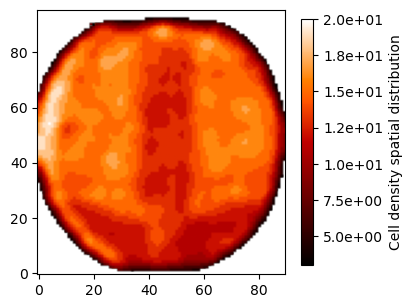

In [45]:
# Display the density of cells
fig, axes = plt.subplots(1, 1, figsize=(4, 4))  # Smaller figure

# SOX2TBRAcounts[SOX2TBRAcounts == 0] = np.nan
# Heatmap plot
all_countss=np.copy(all_counts[:,:-2].T)
heatmap = axes.imshow(np.log(all_counts.T), cmap='gist_heat', origin='lower')

#Smooth the image
all_countss = ski.filters.gaussian(all_countss, sigma=2, mode='reflect')

#digitize the image in downscaled bins
bins = 20
all_countss = np.digitize(all_countss, np.linspace(np.nanmin(all_countss), np.nanmax(all_countss),bins)).astype(float)
all_countss[~mask_zero[:-2]] = np.nan

heatmap = axes.imshow((all_countss), cmap='gist_heat', origin='lower')

# Add a colorbar linked to the heatmap
cbar = plt.colorbar(heatmap, ax=axes, shrink=0.8)  # Smaller colorbar
cbar.set_label(f'Cell density spatial distribution')

# Change colorbar to scientific notation (e-3)
formatter = ticker.FuncFormatter(lambda x, _: f'{x:.1e}')
cbar.formatter = formatter
cbar.update_ticks()


#### Now in mesoderm centric view

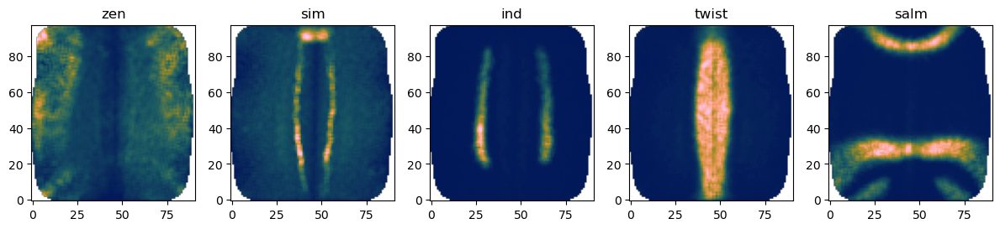

In [56]:
# Filter epiblast cells
epi_nuc = all_cells.copy()


# Scale position_dv coordinates
ant_limit = abs(epi_nuc['Scaled_Rel_AP_position_dv'].min())
LR_mid = abs(epi_nuc['Scaled_Rel_LR_position_dv'].min())

#Store the length scales
PS_length = epi_nuc['Scaled_Rel_AP_position_dv'].max()
LR_length = epi_nuc['Scaled_Rel_LR_position_dv'].max() + abs(epi_nuc['Scaled_Rel_LR_position_dv'].min())

epi_nuc['Scaled_Rel_AP_position_dv'] -= epi_nuc['Scaled_Rel_AP_position_dv'].min()
epi_nuc['Scaled_Rel_LR_position_dv'] -= epi_nuc['Scaled_Rel_LR_position_dv'].min()

# Configuration settings
x_col, y_col = 'Scaled_Rel_LR_position_dv', 'Scaled_Rel_AP_position_dv'
channels = ['zen','sim', 'ind', 'twist', 'salm']   

embryos = all_cells['embryo'].unique()
scale, pad, ant_cut = 5, 20, 0
img_shape = (int(epi_nuc[x_col].max() / scale), int(epi_nuc[y_col].max() / scale))
LR_mid, ant_limit = int(LR_mid / scale), (ant_limit // scale) - ant_cut
post_lim = int(epi_nuc[y_col].max() / scale) - ant_cut
APmid = post_lim - ant_limit

# Initialize storage
avg_imgs = {channel: np.zeros(img_shape) for channel in channels}
counts = {channel: np.zeros(img_shape) for channel in channels}
all_counts = np.zeros(img_shape)
SOX2TBRAcounts = np.zeros(img_shape)
SOX2TBRA_outlines = []
fp_size = 3
footprint = np.ones((fp_size, fp_size))

# Process each embryo
for embryo in embryos:
    temp = epi_nuc[epi_nuc['embryo'] == embryo].copy().dropna(subset=[x_col, y_col] + channels)

    # Bin and average channel data
    x_bins, y_bins = (temp[x_col] / scale).astype(int), (temp[y_col] / scale).astype(int)
    np.add.at(all_counts, (x_bins-1, y_bins-1), 1)

    for channel in channels:
        img, count = np.zeros(img_shape), np.zeros(img_shape)
        np.add.at(img, (x_bins-1, y_bins-1), temp[channel])
        np.add.at(count, (x_bins-1, y_bins-1), 1)
        valid = count > 0
        img[valid] /= count[valid]
        avg_imgs[channel] += img
        counts[channel] += valid

# Finalize averages
for channel in channels:
    valid = counts[channel] > 0
    avg_imgs[channel][valid] /= len(embryos)

# Create epiblast mask
mask_zero = np.pad(all_counts > 0, ((pad, pad), (pad, pad)), constant_values=0)
mask_zero = ski.filters.gaussian(mask_zero, sigma=8) > 0.4
mask_zero = mask_zero.T

#Store images for later
channel_imgs = []

# Display channel images
fig, axes = plt.subplots(1, len(channels), figsize=(12, 4))
for idx, channel in enumerate(channels):
    image = np.pad(avg_imgs[channel].T, ((pad, pad), (pad, pad)), constant_values=0)
    image = ski.exposure.rescale_intensity(image, in_range='image', out_range=(0, 1))
    image = ski.filters.rank.mean_bilateral(image, footprint=footprint, s0=500, s1=500).astype(float)


    image[~mask_zero] = np.nan
    image = image[ant_cut:][pad:-pad, pad:-pad]

    channel_imgs.append(image)

    axes[idx].imshow(image, origin='lower', cmap=cmc.batlow)

    axes[idx].set_title(channel)
plt.tight_layout()

plt.show()

#remove padding of the mask and cut
mask_zero = mask_zero[ant_cut:]
mask_zero = mask_zero[pad:-pad, pad:-pad]


Text(0, 0.5, 'Relative AP position (um)')

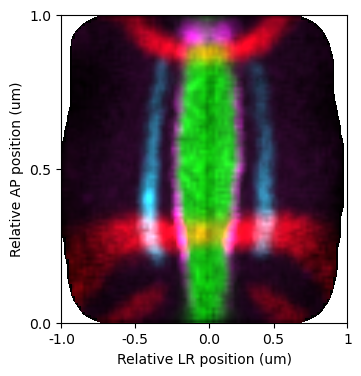

In [ ]:
channel1, channel2, channel3, channel4, channel5 = channel_imgs
scaling_factor = 20

#resized image 
channel1 = ski.transform.rescale(channel1, scaling_factor, anti_aliasing=True)
channel2 = ski.transform.rescale(channel2, scaling_factor, anti_aliasing=True)
channel3 = ski.transform.rescale(channel3, scaling_factor, anti_aliasing=True)
channel4 = ski.transform.rescale(channel4, scaling_factor, anti_aliasing=True)
channel5 = ski.transform.rescale(channel5, scaling_factor, anti_aliasing=True)

mask_zero_resc = ski.transform.rescale(mask_zero, scaling_factor)

#smooth the mask
mask_zero_resc = ski.filters.gaussian(mask_zero_resc, sigma=30, mode='constant', cval=0)
mask_zero_resc = mask_zero_resc > 0.5

#Set nans to 0
channel1[np.isnan(channel1)] = 0
channel2[np.isnan(channel2)] = 0
channel3[np.isnan(channel3)] = 0
channel4[np.isnan(channel4)] = 0
channel5[np.isnan(channel5)] = 0

channel1[~mask_zero_resc] = np.nan
channel2[~mask_zero_resc] = np.nan
channel3[~mask_zero_resc] = np.nan
channel4[~mask_zero_resc] = np.nan
channel5[~mask_zero_resc] = np.nan

#Set mask where image is nan
maskNan = np.isnan(channel1)

# #Digitize the image channels into 10 bins if wanted

# bins = 8
# channel1 = np.digitize(channel1, np.linspace(np.nanmin(channel1), np.nanmax(channel1),bins)).astype(float)
# channel2 = np.digitize(channel2, np.linspace(np.nanmin(channel2), np.nanmax(channel2), bins)).astype(float)
# channel3 = np.digitize(channel3, np.linspace(np.nanmin(channel3), np.nanmax(channel3), bins)).astype(float)
# channel4 = np.digitize(channel4, np.linspace(np.nanmin(channel4), np.nanmax(channel4), bins)).astype(float)
# channel5 = np.digitize(channel5, np.linspace(np.nanmin(channel5), np.nanmax(channel5), bins)).astype(float)

channel1[maskNan] = np.nan
channel2[maskNan] = np.nan
channel3[maskNan] = np.nan
channel4[maskNan] = np.nan
channel5[maskNan] = np.nan

# Normalize each channel if they aren’t already between 0 and 1
channel1 = (channel1 - np.nanmin(channel1)) / np.nanmax(channel1- np.nanmin(channel1))
channel2 = (channel2 - np.nanmin(channel2)) / np.nanmax(channel2- np.nanmin(channel2))
channel3 = (channel3 - np.nanmin(channel3)) / np.nanmax(channel3- np.nanmin(channel3))
channel4 = (channel4 - np.nanmin(channel4)) / np.nanmax(channel4- np.nanmin(channel4))
channel5 = (channel5 - np.nanmin(channel5)) / np.nanmax(channel5- np.nanmin(channel5))

# Map each channel to its respective color
red = np.stack([channel5, np.zeros_like(channel5), np.zeros_like(channel5)], axis=2)  # Red
magenta = np.stack([channel2, np.zeros_like(channel2), channel2], axis=2)             # Magenta
green = np.stack([np.zeros_like(channel4), channel4, np.zeros_like(channel4)], axis=2) # Green
cyan = np.stack([np.zeros_like(channel3), channel3, channel3], axis=2)               # Cyan

# Combine them by adding the colors together
rgb_image = np.clip(green + magenta + cyan+ red , 0, 1)  # Clip to avoid overflow

#Scale the custom ticks by the upscaling (20)
ant_limit_sc = ant_limit * scaling_factor
LR_mid_sc = LR_mid * scaling_factor
post_lim_sc = post_lim * scaling_factor
ant_cut_sc = ant_cut * scaling_factor


fig, axes = plt.subplots(1, 1, figsize=(4, 4))

# Display the final RGB image
axes.imshow(rgb_image, origin='lower', interpolation='nearest')

axes.set_xticks([0, LR_mid_sc/2,LR_mid_sc, channel1.shape[1] - LR_mid_sc/2, channel1.shape[1]])        # Custom x-axis ticks
axes.set_xticks([0, LR_mid_sc/2,LR_mid_sc, channel1.shape[1] - LR_mid_sc/2, channel1.shape[1]])          # Custom x-axis ticks
axes.set_xticklabels([-1.0, -0.5, 0.0, 0.5, 1])
axes.set_xticklabels([-1.0, -0.5, 0.0, 0.5, 1])

axes.set_yticks([ant_limit_sc,  (post_lim_sc-ant_limit_sc)/2 + ant_cut_sc/2, post_lim_sc ])        # Custom x-axis ticks
axes.set_yticks([ant_limit_sc, (post_lim_sc-ant_limit_sc)/2 + ant_cut_sc/2, post_lim_sc])  
axes.set_yticklabels([0.0, 0.5, 1.0])
axes.set_yticklabels([0.0, 0.5, 1.0])

#set xy labels
axes.set_xlabel('Relative LR position')
axes.set_ylabel('Relative AP position')



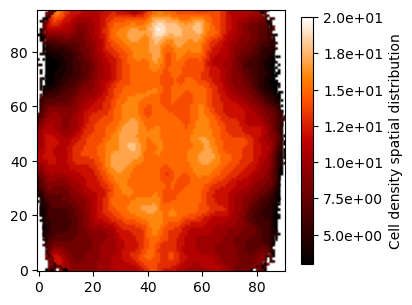

In [50]:
# Display the density of cells
fig, axes = plt.subplots(1, 1, figsize=(4, 4))  # Smaller figure

# SOX2TBRAcounts[SOX2TBRAcounts == 0] = np.nan
# Heatmap plot
all_countss=np.copy(all_counts[:,:-2].T)
heatmap = axes.imshow(np.log(all_counts.T), cmap='gist_heat', origin='lower')

#Smooth the image
all_countss = ski.filters.gaussian(all_countss, sigma=2, mode='reflect')

#digitize the image in downscaled bins
bins = 20
all_countss = np.digitize(all_countss, np.linspace(np.nanmin(all_countss), np.nanmax(all_countss),bins)).astype(float)
all_countss[~mask_zero[:-2]] = np.nan

heatmap = axes.imshow((all_countss), cmap='gist_heat', origin='lower')

# Add a colorbar linked to the heatmap
cbar = plt.colorbar(heatmap, ax=axes, shrink=0.8)  # Smaller colorbar
cbar.set_label(f'Cell density spatial distribution')

# Change colorbar to scientific notation (e-3)
formatter = ticker.FuncFormatter(lambda x, _: f'{x:.1e}')
cbar.formatter = formatter
cbar.update_ticks()
